# Body vs Fringe Comparison: A-B-B-A Hysteresis Analysis

**Campaign:** MBB max speed + extended idle (2026-03-10)

| Session | Order | MD1 type | Timestamp | Peak MD1 I |
|---------|-------|----------|-----------|------------|
| **A1** | 1st | 200 GeV | 17:04 | ~2345 A (instantaneous DCCT) |
| **B1** | 2nd | 26 GeV | 17:25 | ~301 A (injection) |
| **B2** | 3rd | 26 GeV | 17:47 | ~301 A (injection) |
| **A2** | 4th | 200 GeV | 18:08 | ~2345 A (instantaneous DCCT) |

This notebook compares body (TF ≈ 0.35 T/kA) and fringe (TF ≈ 0.06 T/kA) segments
side by side for all analyses.

---
## 1. Configuration & Imports

In [1]:
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib widget
plt.rcParams.update({"figure.figsize": (12, 5), "axes.grid": True, "grid.alpha": 0.3, "figure.dpi": 100})

REPO_ROOT = Path(".").resolve()
while REPO_ROOT != REPO_ROOT.parent:
    if (REPO_ROOT / "pyproject.toml").exists() or (REPO_ROOT / ".git").exists():
        break
    REPO_ROOT = REPO_ROOT.parent
MEAS = REPO_ROOT / "measurements"

CAMPAIGN = "MBB/2026-03-10_max_speed_idle"
SEGMENTS = ["body", "fringe"]
FILE_STEMS = {
    "A1 (200 GeV)": f"{CAMPAIGN}/20260310_170427_SPS_MBB/20260310_170449_MBB/20260310_170449_MBB_Run_00_I_0.00A",
    "B1 (26 GeV)":  f"{CAMPAIGN}/20260310_172501_SPS_MBB/20260310_172522_MBB/20260310_172522_MBB_Run_00_I_0.00A",
    "B2 (26 GeV)":  f"{CAMPAIGN}/20260310_174733_SPS_MBB/20260310_174754_MBB/20260310_174754_MBB_Run_00_I_0.00A",
    "A2 (200 GeV)": f"{CAMPAIGN}/20260310_180839_SPS_MBB/20260310_180902_MBB/20260310_180902_MBB_Run_00_I_0.00A",
}
SESSIONS = {
    "A1 (200 GeV)": {"md1": "200 GeV", "order": 1, "desc": "Full MD1 (peak ~2345 A instantaneous)"},
    "B1 (26 GeV)":  {"md1": "26 GeV",  "order": 2, "desc": "Flattened MD1 (injection only, ~301 A)"},
    "B2 (26 GeV)":  {"md1": "26 GeV",  "order": 3, "desc": "Flattened MD1 (injection only, ~301 A)"},
    "A2 (200 GeV)": {"md1": "200 GeV", "order": 4, "desc": "Full MD1 (peak ~2345 A instantaneous)"},
}
SESSION_NAMES = list(SESSIONS.keys())
I_BANDS = {"idle": (145, 170), "injection": (280, 320), "sftpro_top": (4790, 4840), "lhc_top": (5760, 5800)}
N_SETTLE = {"idle": 50, "injection": 5, "sftpro_top": 15, "lhc_top": 5}
RAMPRATE_THRESHOLD = 5.0

COLORS = {"A1 (200 GeV)": "tab:blue", "B1 (26 GeV)": "tab:orange",
          "B2 (26 GeV)": "tab:green", "A2 (200 GeV)": "tab:red"}
MARKERS = {"A1 (200 GeV)": "o", "B1 (26 GeV)": "s", "B2 (26 GeV)": "D", "A2 (200 GeV)": "^"}
SEG_LABEL = {"body": "Body", "fringe": "Fringe"}
COLOR_MAP = {"ramp": "tab:red", "transient": "tab:orange", "settled": "tab:green"}
LABEL_MAP = {"ramp": "Ramp", "transient": "Plateau (excluded)", "settled": "Plateau (settled, used)"}

print("Body vs Fringe Comparison \u2014 A-B-B-A Protocol")
print("=" * 60)
for name in SESSION_NAMES:
    print(f"  {name}: {SESSIONS[name]['desc']}")


Body vs Fringe Comparison — A-B-B-A Protocol
  A1 (200 GeV): Full MD1 (peak ~2345 A instantaneous)
  B1 (26 GeV): Flattened MD1 (injection only, ~301 A)
  B2 (26 GeV): Flattened MD1 (injection only, ~301 A)
  A2 (200 GeV): Full MD1 (peak ~2345 A instantaneous)


---
## 2. Data Loading

In [2]:
def load_turns(stem, segment):
    fpath = MEAS / f"{stem}_{segment}_results.txt"
    assert fpath.exists(), f"Missing: {fpath}"
    df = pd.read_csv(fpath, sep="\t")
    df = df.rename(columns={
        "Time(s)": "t_s", "Duration(s)": "dur_s", "I(A)": "I_A", "Ramprate(A/s)": "rr",
        "B_main(T)": "B1_T", "A_main(T)": "A1_T",
        "b2(Units)": "b2", "a2(Units)": "a2", "b3(Units)": "b3", "a3(Units)": "a3",
        "b5(Units)": "b5", "a5(Units)": "a5",
    })
    df["turn"] = np.arange(len(df))
    df["t_end"] = df["t_s"] + df["dur_s"]
    df["B1_T"] = -df["B1_T"]
    if "A1_T" in df.columns:
        df["A1_T"] = -df["A1_T"]
    for n in range(2, 16):
        if n % 2 == 0:
            for prefix in ["b", "a"]:
                for col in [f"{prefix}{n}", f"{prefix}{n}(Units)"]:
                    if col in df.columns:
                        df[col] = -df[col]
    return df

turns = {}
for seg in SEGMENTS:
    turns[seg] = {}
    for name in SESSION_NAMES:
        turns[seg][name] = load_turns(FILE_STEMS[name], seg)

for seg in SEGMENTS:
    print(f"\n{SEG_LABEL[seg]} segment:")
    for name in SESSION_NAMES:
        df = turns[seg][name]
        print(f"  {name}: {len(df)} turns, I: {df.I_A.min():.1f} to {df.I_A.max():.1f} A, "
              f"B1: {df.B1_T.min():.4f} to {df.B1_T.max():.4f} T")



Body segment:
  A1 (200 GeV): 3182 turns, I: -0.1 to 5781.1 A, B1: 0.0008 to 2.0085 T
  B1 (26 GeV): 3628 turns, I: -0.2 to 5781.0 A, B1: 0.0008 to 2.0085 T
  B2 (26 GeV): 3445 turns, I: -0.2 to 5781.0 A, B1: 0.0008 to 2.0085 T
  A2 (200 GeV): 3172 turns, I: -0.2 to 5781.0 A, B1: 0.0008 to 2.0085 T

Fringe segment:
  A1 (200 GeV): 3182 turns, I: -0.1 to 5781.1 A, B1: 0.0001 to 0.3213 T
  B1 (26 GeV): 3628 turns, I: -0.2 to 5781.0 A, B1: 0.0001 to 0.3214 T
  B2 (26 GeV): 3445 turns, I: -0.2 to 5781.0 A, B1: 0.0001 to 0.3214 T
  A2 (200 GeV): 3172 turns, I: -0.2 to 5781.0 A, B1: 0.0001 to 0.3214 T


## 3. Current Profiles (Raw DCCT at ~3030 Hz)

Per-turn averaged current is misleading during fast MD1 ramps (rotation period ~0.34 s comparable to ramp time). Raw DCCT samples show the true current waveform.

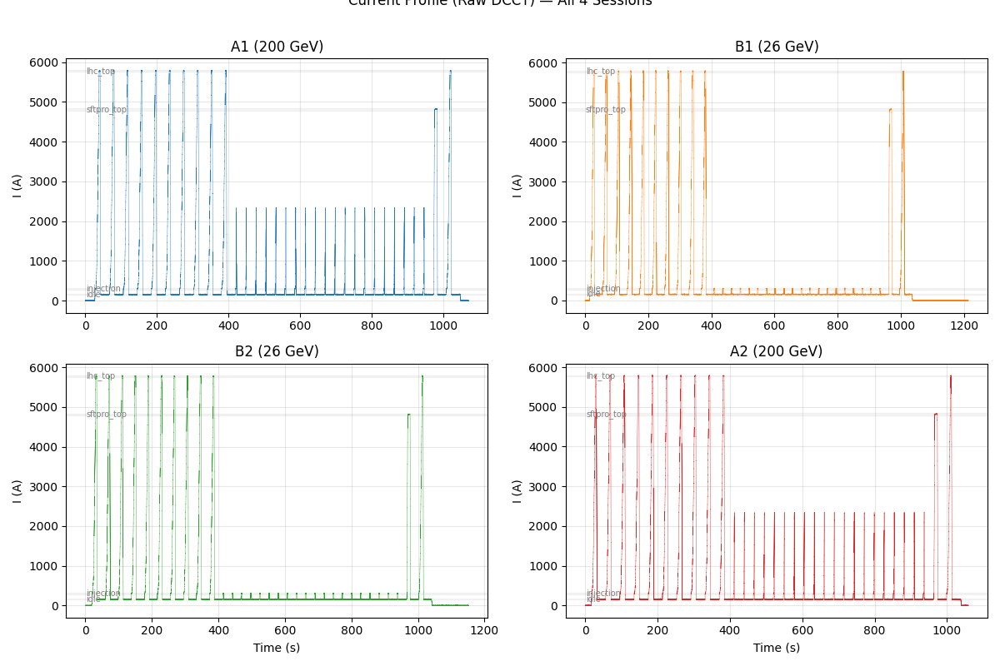

In [3]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=False)
axes = axes.ravel()
for ax, name in zip(axes, SESSION_NAMES):
    # Load raw DCCT from body segment (current is identical for both segments)
    stem = FILE_STEMS[name]
    fpath = MEAS / f"{stem}_body_raw_measurement_data.txt"
    raw = np.loadtxt(fpath, usecols=[0, 3])  # col 0: time, col 3: DCCT current
    t_raw, I_raw = raw[:, 0], raw[:, 1]
    ax.plot(t_raw, I_raw, "-", linewidth=0.3, color=COLORS[name])
    ax.set_ylabel("I (A)"); ax.set_title(name)
    for bname, (lo, hi) in I_BANDS.items():
        ax.axhspan(lo, hi, alpha=0.08, color="grey")
        ax.text(t_raw[0] + 2, (lo + hi) / 2, bname, fontsize=7, va="center", color="grey")
axes[2].set_xlabel("Time (s)"); axes[3].set_xlabel("Time (s)")
fig.suptitle("Current Profile (Raw DCCT) — All 4 Sessions", fontsize=12, y=1.01)
plt.tight_layout(); plt.show()

---
## 4. Plateau Detection & Phase Classification

In [ ]:
def assign_phases(groups):
    """Assign phase: 'std', 'md1', or 'meas'. Meas starts at post-MD1 idle."""
    sft = next((g for g in groups if g["label"] == "sftpro_top"), None)
    t_sft = sft["t_start"] if sft else 1e9
    std_lhc = [g for g in groups if g["label"] == "lhc_top" and g["t_start"] < t_sft]
    t_end_std = max(g["t_end"] for g in std_lhc) if std_lhc else 0
    meas_lhc = next((g for g in groups if g["label"] == "lhc_top" and g["t_start"] > t_sft), None)
    t_meas_lhc = meas_lhc["t_start"] if meas_lhc else 1e9
    md1_active = [g for g in groups if g["label"] != "idle"
                  and t_end_std < g["t_start"] < t_sft]
    t_md1_end = md1_active[-1]["t_end"] if md1_active else t_sft
    std_idle_idx = md1_idle_idx = md1_inj_idx = 0
    for g in groups:
        t, lab = g["t_start"], g["label"]
        if t <= t_end_std:
            g["phase"] = "std"
            if lab == "idle": std_idle_idx += 1; g["phase_idx"] = std_idle_idx
            elif lab == "lhc_top": g["phase_idx"] = std_idle_idx + 1
            else: g["phase_idx"] = 0
        elif t < t_md1_end:
            g["phase"] = "md1"
            if lab == "idle": md1_idle_idx += 1; g["phase_idx"] = md1_idle_idx
            elif lab == "injection": md1_inj_idx += 1; g["phase_idx"] = md1_inj_idx
            else: g["phase_idx"] = 0
        else:
            g["phase"] = "meas"
            if lab == "sftpro_top": g["cycle"] = "SFTPRO"
            elif lab == "lhc_top": g["cycle"] = "LHC"
            elif lab == "idle" and t < t_sft: g["cycle"] = "post-MD1"
            elif lab == "idle" and t < t_meas_lhc: g["cycle"] = "SFTPRO->LHC"
            elif lab == "idle" and t > t_meas_lhc: g["cycle"] = "post-LHC"
            elif lab == "injection": g["cycle"] = "LHC"
            else: g["cycle"] = "transition"
            g["phase_idx"] = 0
    return groups

---
## 5. Turn Classification Map

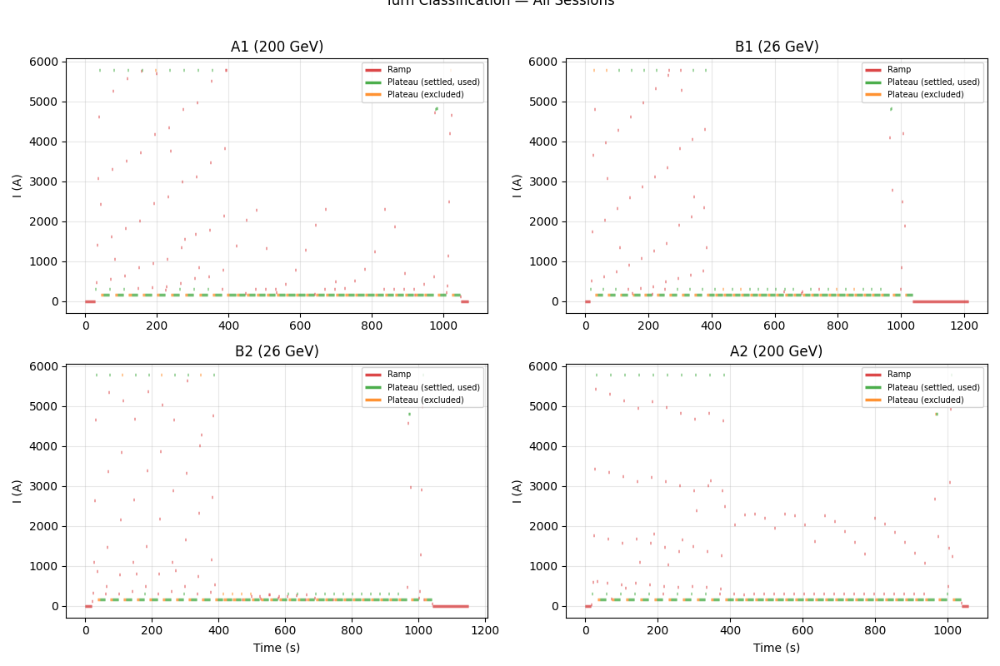

In [5]:
def draw_turn_bars(ax, df, status, idx=None):
    if idx is None: idx = range(len(df))
    drawn = set()
    for i in idx:
        s = status[i]; kw = {}
        if s not in drawn: kw["label"] = LABEL_MAP[s]; drawn.add(s)
        ax.plot([df.t_s.iloc[i], df.t_end.iloc[i]], [df.I_A.iloc[i]]*2,
                linewidth=2.5, color=COLOR_MAP[s], alpha=0.85, solid_capstyle="butt", zorder=2, **kw)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.ravel()
for ax, name in zip(axes, SESSION_NAMES):
    status = classify_turns(turns["body"][name], all_groups[name])
    draw_turn_bars(ax, turns["body"][name], status)
    ax.set_ylabel("I (A)"); ax.set_title(name); ax.legend(loc="upper right", fontsize=7)
axes[2].set_xlabel("Time (s)"); axes[3].set_xlabel("Time (s)")
fig.suptitle("Turn Classification \u2014 All Sessions", fontsize=12, y=1.01)
plt.tight_layout(); plt.show()


---
## 6. Transfer Function — Body vs Fringe

TF = B1/I. Body ≈ 0.35 T/kA, fringe ≈ 0.06 T/kA.

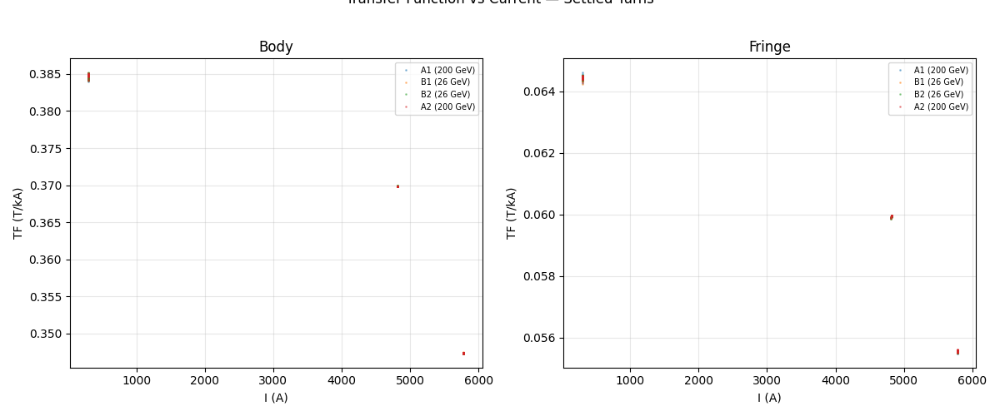

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for seg, ax in zip(SEGMENTS, axes):
    for name in SESSION_NAMES:
        df = turns[seg][name]
        status = classify_turns(df, all_groups[name])
        mask = (status == "settled") & (df.I_A > 200)
        sub = df[mask].copy(); sub["TF"] = sub.B1_T / sub.I_A * 1000
        ax.plot(sub.I_A, sub.TF, ".", ms=2, color=COLORS[name], alpha=0.4, label=name)
    ax.set_xlabel("I (A)"); ax.set_ylabel("TF (T/kA)")
    ax.set_title(f"{SEG_LABEL[seg]}"); ax.legend(fontsize=7)
fig.suptitle("Transfer Function vs Current \u2014 Settled Turns", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()


---
## 7. Standardization Convergence — Body vs Fringe

B1, b2, b3 at idle (~155 A) after each standardization cycle.

In [7]:
def settled_stats(df, group, n_settle):
    n = min(n_settle, group["n_turns"])
    sub = df.iloc[group["end"]-n:group["end"]]
    out = {"n_turns": n, "I_mean": sub["I_A"].mean(),
           "I_range": sub["I_A"].max() - sub["I_A"].min()}
    for col in ["B1_T", "b2", "b3"]:
        if col in sub.columns:
            out[f"{col}_mean"] = sub[col].mean()
            out[f"{col}_std"] = sub[col].std()
    return out

---
## 8. MD1 Accommodation at Idle — Body vs Fringe

Per-idle-period B1, b2, b3 at ~155 A after each MD1 cycle.

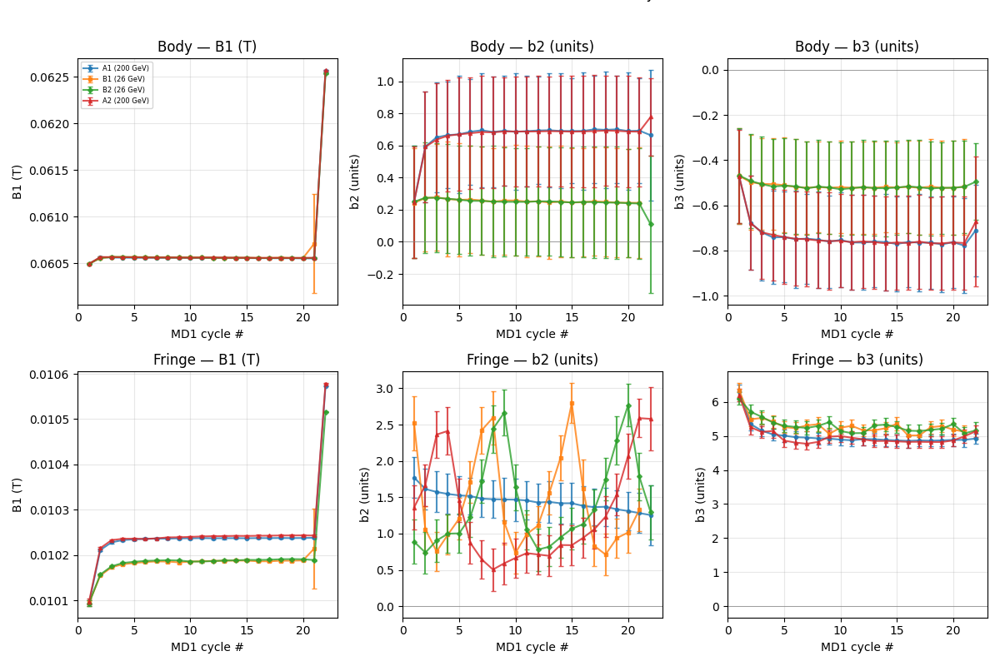

In [8]:
md1_conv = {}
for seg in SEGMENTS:
    md1_conv[seg] = {}
    for name in SESSION_NAMES:
        idles = [g for g in all_groups[name] if g["phase"] == "md1" and g["label"] == "idle"]
        rows = []
        for g in idles:
            s = settled_stats(turns[seg][name], g, N_SETTLE["idle"])
            s["cycle"] = g["phase_idx"]
            rows.append(s)
        md1_conv[seg][name] = pd.DataFrame(rows) if rows else pd.DataFrame()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for row, seg in enumerate(SEGMENTS):
    for ci, (col, ylabel) in enumerate([("B1_T","B1 (T)"),("b2","b2 (units)"),("b3","b3 (units)")]):
        ax = axes[row, ci]
        for name in SESSION_NAMES:
            dc = md1_conv[seg][name]
            if dc.empty: continue
            ax.errorbar(dc["cycle"], dc[f"{col}_mean"], yerr=dc[f"{col}_std"],
                        fmt=f"{MARKERS[name]}-", ms=3, capsize=2, color=COLORS[name], alpha=0.8,
                        label=name if row==0 else None)
        ax.set_xlabel("MD1 cycle #"); ax.set_ylabel(ylabel)
        ax.set_title(f"{SEG_LABEL[seg]} \u2014 {ylabel}")
        if col != "B1_T": ax.axhline(0, color="grey", lw=0.5)
        if row==0 and ci==0: ax.legend(fontsize=6)
fig.suptitle("MD1 Accommodation \u2014 Idle After Each MD1 Cycle", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()


In [9]:
print("MD1 Accommodation: first 3 vs last 3 idle periods")
print("=" * 95)
for seg in SEGMENTS:
    print(f"\n--- {SEG_LABEL[seg]} ---")
    for name in SESSION_NAMES:
        dc = md1_conv[seg][name]
        dc = dc[(dc["n_turns"] >= 20) & (dc["I_range"] < 2.0)]
        if dc.empty or len(dc) < 6: print(f"  {name}: insufficient data"); continue
        print(f"  {name}:")
        for col, unit in [("B1_T","T"),("b2","units"),("b3","units")]:
            f3 = dc[f"{col}_mean"].iloc[:3].mean()
            l3 = dc[f"{col}_mean"].iloc[-3:].mean()
            d = l3 - f3
            if unit == "T":
                print(f"    {col}: first3={f3:.6f}, last3={l3:.6f}, drift={d*1e6:+.1f} uT")
            else:
                print(f"    {col}: first3={f3:.4f}, last3={l3:.4f}, drift={d:+.4f} {unit}")

MD1 Accommodation: first 3 vs last 3 idle periods

--- Body ---
  A1 (200 GeV):
    B1_T: first3=0.060541, last3=0.060555, drift=+13.9 uT
    b2: first3=0.4989, last3=0.6952, drift=+0.1962 units
    b3: first3=-0.6231, last3=-0.7716, drift=-0.1485 units
  B1 (26 GeV):
    B1_T: first3=0.060541, last3=0.060559, drift=+18.1 uT
    b2: first3=0.2645, last3=0.2457, drift=-0.0188 units
    b3: first3=-0.4907, last3=-0.5209, drift=-0.0302 units
  B2 (26 GeV):
    B1_T: first3=0.060542, last3=0.060558, drift=+16.7 uT
    b2: first3=0.2664, last3=0.2414, drift=-0.0250 units
    b3: first3=-0.4889, last3=-0.5210, drift=-0.0321 units
  A2 (200 GeV):
    B1_T: first3=0.060545, last3=0.060560, drift=+15.5 uT
    b2: first3=0.4922, last3=0.6889, drift=+0.1967 units
    b3: first3=-0.6232, last3=-0.7664, drift=-0.1433 units

--- Fringe ---
  A1 (200 GeV):
    B1_T: first3=0.010178, last3=0.010238, drift=+60.3 uT
    b2: first3=1.6530, last3=1.3096, drift=-0.3434 units
    b3: first3=5.6049, last3=4.

---
## 9. MD1 Idle Turn-by-Turn B1 — Body vs Fringe

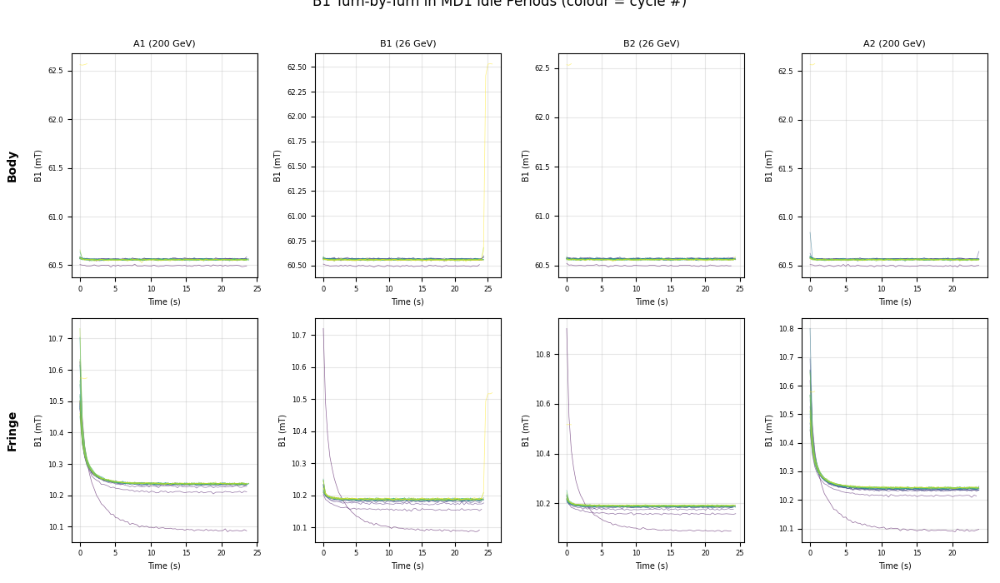

In [10]:
fig, axes = plt.subplots(2, 4, figsize=(12, 7))
for row, seg in enumerate(SEGMENTS):
    for ci, name in enumerate(SESSION_NAMES):
        ax = axes[row, ci]
        idles = [g for g in all_groups[name] if g["phase"] == "md1" and g["label"] == "idle"]
        df = turns[seg][name]
        cmap = plt.cm.viridis(np.linspace(0, 1, max(len(idles), 1)))
        for k, g in enumerate(idles):
            sub = df.iloc[g["start"]:g["end"]]
            lt = sub.t_s.values - sub.t_s.values[0]
            ax.plot(lt, sub.B1_T*1e3, "-", lw=0.5, color=cmap[k], alpha=0.6)
        ax.set_xlabel("Time (s)", fontsize=7); ax.set_ylabel("B1 (mT)", fontsize=7)
        ax.tick_params(labelsize=6)
        if row == 0: ax.set_title(name, fontsize=8)
        if ci == 0:
            ax.text(-0.35, 0.5, SEG_LABEL[seg], transform=ax.transAxes,
                    fontsize=10, fontweight="bold", va="center", rotation=90)
fig.suptitle("B1 Turn-by-Turn in MD1 Idle Periods (colour = cycle #)", fontsize=12, y=1.01)
plt.tight_layout(); plt.show()


---
## 8b. Eddy Current Settling Analysis

Turn-by-turn settling of B1, b2, b3 on each current plateau (body vs fringe).

**Clean plateau turns** (|ramp rate| < 1 A/s) are highlighted with filled markers.
Edge turns shown as faded crosses. Single-exponential fit: y(t) = y_inf + A * exp(-t / tau)

In [11]:
from scipy.optimize import curve_fit

RR_PLATEAU = 1.0

def eddy_1tau(t, y_inf, A, tau):
    return y_inf + A * np.exp(-t / tau)

def fit_settling(t, y):
    t, y = np.asarray(t, float), np.asarray(y, float)
    if len(t) < 5:
        return dict(y_inf=np.nan, A=np.nan, tau=np.nan, R2=np.nan, ok=False)
    y_inf0 = y[-max(3, len(y)//4):].mean()
    A0 = y[0] - y_inf0 or 1e-12
    tau0 = np.clip((t[-1] - t[0]) / 5, 0.3, 50)
    try:
        popt, _ = curve_fit(eddy_1tau, t, y, p0=[y_inf0, A0, tau0],
                            bounds=([-np.inf, -np.inf, 0.05], [np.inf, np.inf, 200]),
                            maxfev=10000)
        resid = y - eddy_1tau(t, *popt)
        ss_tot = np.sum((y - y.mean())**2)
        r2 = 1 - np.sum(resid**2) / ss_tot if ss_tot > 0 else 0
        return dict(y_inf=popt[0], A=popt[1], tau=popt[2], R2=r2, ok=True)
    except Exception:
        return dict(y_inf=np.nan, A=np.nan, tau=np.nan, R2=np.nan, ok=False)


def find_last_clean_md1_idle(groups, df):
    """Last MD1 idle with >= 40 turns and I_range < 3 A."""
    idles = [g for g in groups if g["phase"] == "md1" and g["label"] == "idle"
             and g["n_turns"] >= 40]
    for g in reversed(idles):
        sub = df.iloc[g["start"]:g["end"]]
        if sub["I_A"].max() - sub["I_A"].min() < 3.0:
            return g
    return None


EDDY_PLATEAUS_SIMPLE = [
    ("SFTPRO top",       lambda gs: [g for g in gs if g.get("cycle")=="SFTPRO" and g["label"]=="sftpro_top"]),
    ("Post-SFTPRO idle", lambda gs: [g for g in gs if g.get("cycle")=="SFTPRO->LHC" and g["label"]=="idle"]),
    ("LHC top",          lambda gs: [g for g in gs if g.get("cycle")=="LHC" and g["label"]=="lhc_top"]),
    ("Post-LHC idle",    lambda gs: [g for g in gs if g.get("cycle")=="post-LHC" and g["label"]=="idle"]),
]
EDDY_PLAT_NAMES = ["Last clean MD1 idle"] + [p[0] for p in EDDY_PLATEAUS_SIMPLE]

# Compute eddy fits for both segments
eddy_data = {}  # {seg: {plat: {session: {...}}}}
for seg in SEGMENTS:
    eddy_data[seg] = {}
    # Last clean MD1 idle (special finder needs access to turns data)
    eddy_data[seg]["Last clean MD1 idle"] = {}
    for name in SESSION_NAMES:
        g = find_last_clean_md1_idle(all_groups[name], turns[seg][name])
        if g is None:
            continue
        sub = turns[seg][name].iloc[g["start"]:g["end"]].copy()
        sub["local_t"] = sub["t_s"].values - sub["t_s"].values[0]
        is_clean = np.abs(sub["rr"].values) < RR_PLATEAU
        clean = sub[is_clean]
        fits = {}
        for col in ["B1_T", "b2", "b3"]:
            fits[col] = fit_settling(clean["local_t"].values, clean[col].values) \
                        if len(clean) >= 5 else dict(ok=False)
        eddy_data[seg]["Last clean MD1 idle"][name] = dict(
            sub=sub, clean=clean, is_clean=is_clean, fits=fits,
            cycle_idx=g.get("phase_idx", "?"))
    # Other plateaus
    for plat_label, finder in EDDY_PLATEAUS_SIMPLE:
        eddy_data[seg][plat_label] = {}
        for name in SESSION_NAMES:
            matches = finder(all_groups[name])
            if not matches:
                continue
            g = matches[0]
            sub = turns[seg][name].iloc[g["start"]:g["end"]].copy()
            sub["local_t"] = sub["t_s"].values - sub["t_s"].values[0]
            is_clean = np.abs(sub["rr"].values) < RR_PLATEAU
            clean = sub[is_clean]
            fits = {}
            for col in ["B1_T", "b2", "b3"]:
                fits[col] = fit_settling(clean["local_t"].values, clean[col].values) \
                            if len(clean) >= 5 else dict(ok=False)
            eddy_data[seg][plat_label][name] = dict(
                sub=sub, clean=clean, is_clean=is_clean, fits=fits)

# Summary table
for seg in SEGMENTS:
    print(f"\n{'='*120}")
    print(f"  {SEG_LABEL[seg]} segment — Eddy Settling: y(t) = y_inf + A*exp(-t/tau)")
    print(f"{'='*120}")
    for plat_label in EDDY_PLAT_NAMES:
        print(f"\n  {plat_label}")
        if "MD1" in plat_label:
            for name in SESSION_NAMES:
                d = eddy_data[seg][plat_label].get(name)
                if d:
                    print(f"    {name}: cycle #{d.get('cycle_idx','?')}, "
                          f"{len(d['sub'])} turns, {len(d['clean'])} clean")
        print(f"  {'Session':<16s} {'N':>3s} {'Ncl':>3s}   "
              f"{'B1: A(uT)':>10s} {'tau(s)':>7s} {'R2':>6s}   "
              f"{'b2: A(u)':>9s} {'tau(s)':>7s} {'R2':>6s}   "
              f"{'b3: A(u)':>9s} {'tau(s)':>7s} {'R2':>6s}")
        print("  " + "-" * 108)
        for name in SESSION_NAMES:
            d = eddy_data[seg][plat_label].get(name)
            if d is None:
                continue
            line = f"  {name:<16s} {len(d['sub']):>3d} {len(d['clean']):>3d}   "
            for col, scale, fmt in [("B1_T", 1e6, ".1f"), ("b2", 1, ".3f"), ("b3", 1, ".3f")]:
                f = d["fits"][col]
                if f.get("ok"):
                    line += f"{f['A']*scale:>+10{fmt}} {f['tau']:>7.2f} {f['R2']:>6.3f}   "
                else:
                    line += f"{'--':>10s} {'--':>7s} {'--':>6s}   "
            print(line)


  Body segment — Eddy Settling: y(t) = y_inf + A*exp(-t/tau)

  Last clean MD1 idle
    A1 (200 GeV): cycle #21, 71 turns, 51 clean
    B1 (26 GeV): cycle #20, 74 turns, 45 clean
    B2 (26 GeV): cycle #21, 74 turns, 50 clean
    A2 (200 GeV): cycle #21, 72 turns, 44 clean
  Session            N Ncl    B1: A(uT)  tau(s)     R2    b2: A(u)  tau(s)     R2    b3: A(u)  tau(s)     R2
  ------------------------------------------------------------------------------------------------------------
  A1 (200 GeV)      71  51        +23.9    0.11  0.224       +0.193   18.96  0.014       +0.912  199.96  0.020   
  B1 (26 GeV)       74  45        +19.0    0.15  0.267       +0.410    0.13  0.036       -0.005    4.31  0.000   
  B2 (26 GeV)       74  50        -19.3  200.00  0.011       +0.934  200.00  0.009       +0.362  200.00  0.004   
  A2 (200 GeV)      72  44         +9.5    1.03  0.074       +0.208    2.34  0.013       +0.005    4.39  0.000   

  SFTPRO top
  Session            N Ncl    B1: A

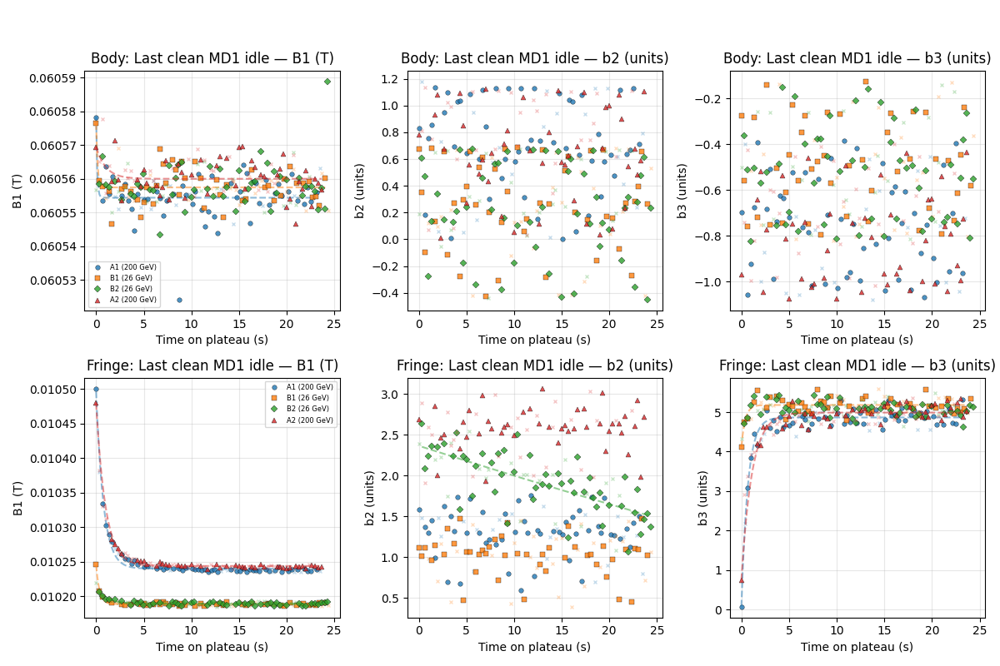

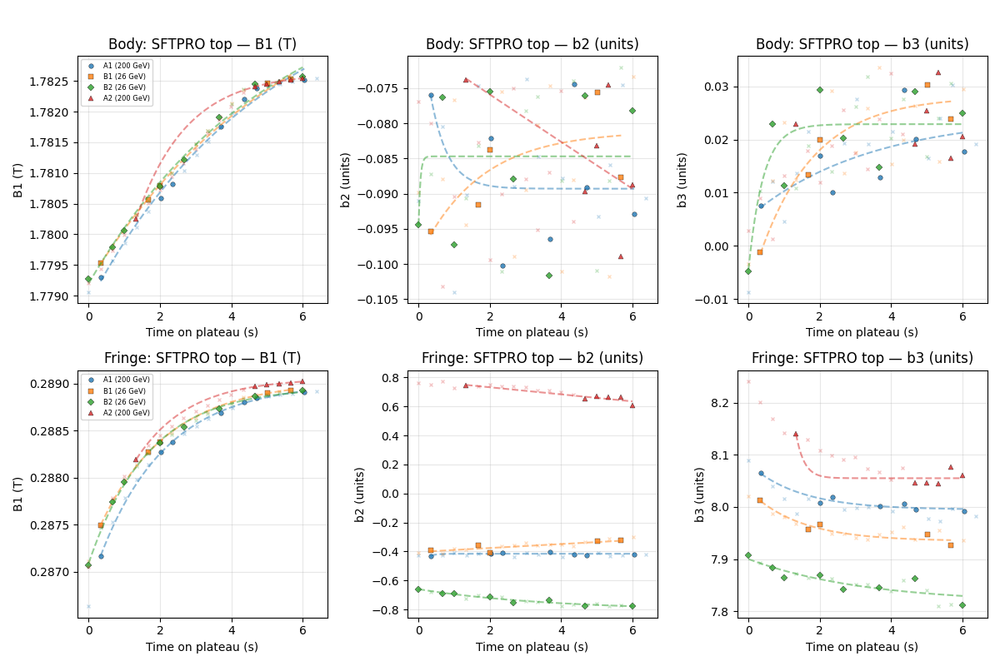

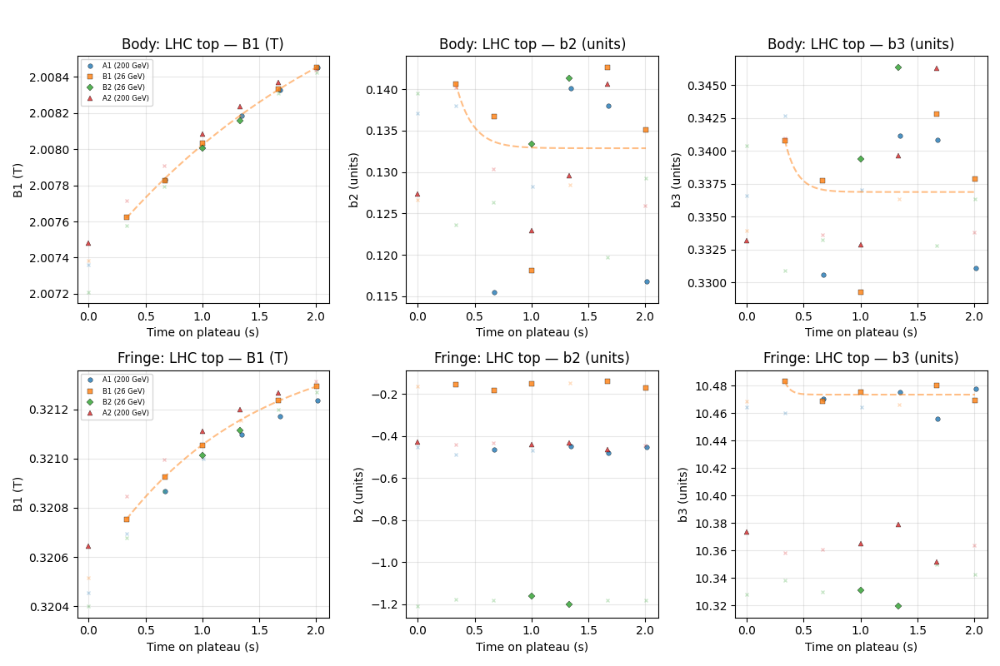

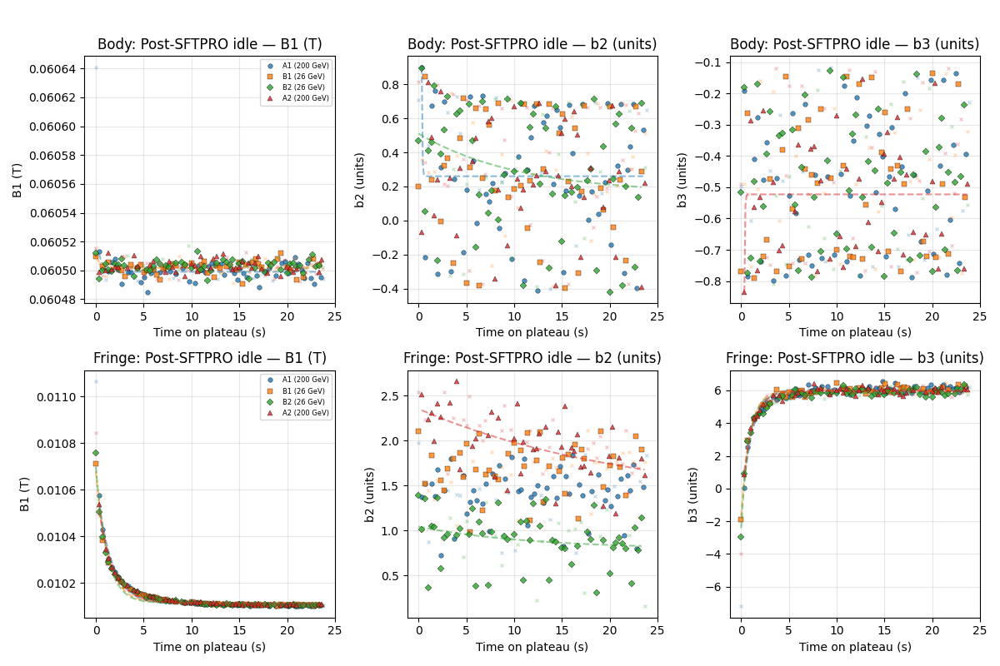

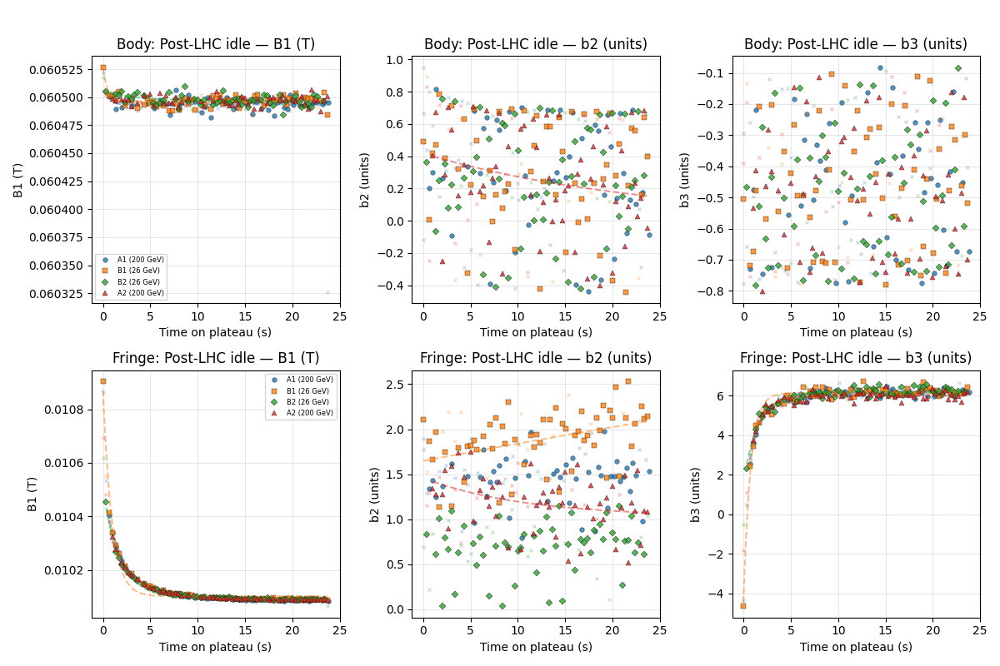

In [12]:
def plot_settling_panel(axes_row, seg, plat_label):
    """Plot B1, b2, b3 settling for one plateau/segment across sessions."""
    for ci, (col, ylabel) in enumerate(zip(
        ["B1_T", "b2", "b3"], ["B1 (T)", "b2 (units)", "b3 (units)"]
    )):
        ax = axes_row[ci]
        for name in SESSION_NAMES:
            d = eddy_data[seg][plat_label].get(name)
            if d is None:
                continue
            sub, clean, is_clean = d["sub"], d["clean"], d["is_clean"]
            edge = sub[~is_clean]
            if len(edge):
                ax.plot(edge["local_t"], edge[col], "x", ms=3,
                        alpha=0.25, color=COLORS[name])
            ax.plot(clean["local_t"], clean[col],
                    MARKERS[name], ms=4, color=COLORS[name],
                    alpha=0.8, label=name, markeredgewidth=0.3,
                    markeredgecolor="black")
            f = d["fits"][col]
            if f.get("ok") and f["R2"] > 0.05:
                t_fit = np.linspace(clean["local_t"].min(),
                                    clean["local_t"].max(), 200)
                ax.plot(t_fit, eddy_1tau(t_fit, f["y_inf"], f["A"], f["tau"]),
                        "--", color=COLORS[name], alpha=0.5, lw=1.5)
        ax.set_xlabel("Time on plateau (s)")
        ax.set_ylabel(ylabel)
        ax.set_title(f"{SEG_LABEL[seg]}: {plat_label} \u2014 {ylabel}")
        if ci == 0:
            ax.legend(fontsize=6)


# --- Figure 1: Last clean MD1 idle — body vs fringe ---
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
plot_settling_panel(axes[0], "body",   "Last clean MD1 idle")
plot_settling_panel(axes[1], "fringe", "Last clean MD1 idle")
fig.suptitle("Eddy Settling: Last Clean MD1 Idle\n"
             "\u2715 = edge turns, markers = clean plateau, dashed = exp fit",
             fontsize=11, y=1.04)
plt.tight_layout()
plt.show()

# --- Figures for each measurement plateau: body vs fringe ---
for plat in ["SFTPRO top", "LHC top", "Post-SFTPRO idle", "Post-LHC idle"]:
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    plot_settling_panel(axes[0], "body",   plat)
    plot_settling_panel(axes[1], "fringe", plat)
    fig.suptitle(f"Eddy Settling: {plat} (top=body, bottom=fringe)", fontsize=11, y=1.02)
    plt.tight_layout()
    plt.show()

---
## 10. SFTPRO Flat Top — Body vs Fringe

=== SFTPRO Top (~4816 A) ===

--- Body ---
  A1 (200 GeV): B1=1.781757 +/- 0.000766 T, b2=-0.086, b3=0.020
  B1 (26 GeV): B1=1.781729 +/- 0.000785 T, b2=-0.086, b3=0.022
  B2 (26 GeV): B1=1.781729 +/- 0.000793 T, b2=-0.085, b3=0.023
  A2 (200 GeV): B1=1.781686 +/- 0.000805 T, b2=-0.086, b3=0.021

--- Fringe ---
  A1 (200 GeV): B1=0.288663 +/- 0.000252 T, b2=-0.421, b3=7.997
  B1 (26 GeV): B1=0.288675 +/- 0.000257 T, b2=-0.349, b3=7.948
  B2 (26 GeV): B1=0.288657 +/- 0.000258 T, b2=-0.748, b3=7.846
  A2 (200 GeV): B1=0.288750 +/- 0.000266 T, b2=0.700, b3=8.080


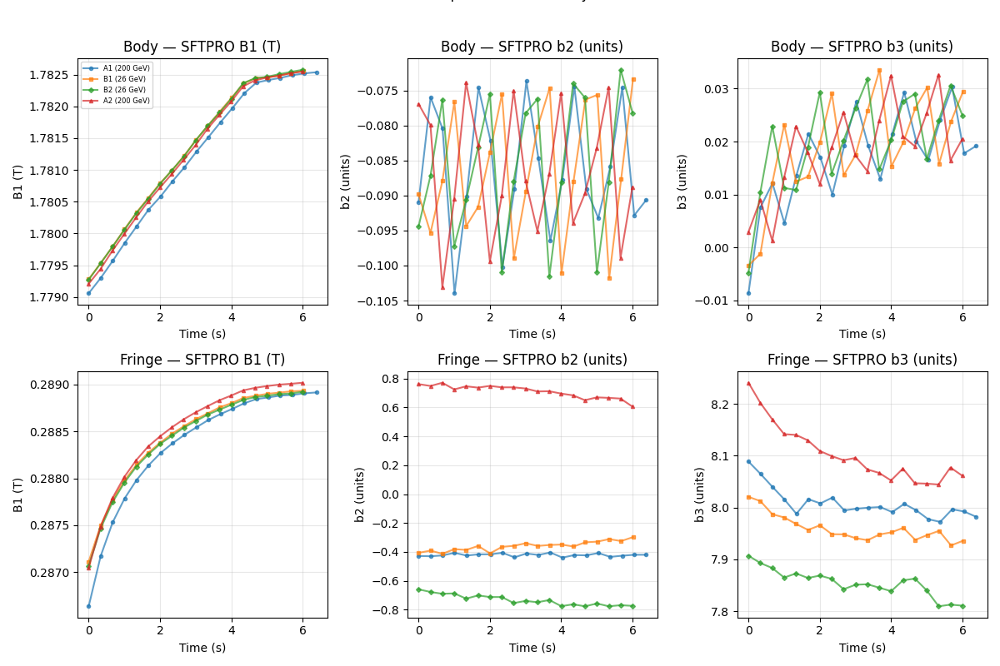

In [13]:
def get_group(groups, phase=None, cycle=None, label=None):
    for g in groups:
        if phase is not None and g.get("phase") != phase: continue
        if cycle is not None and g.get("cycle") != cycle: continue
        if label is not None and g["label"] != label: continue
        return g
    return None

def get_settled_slice(df, group, n_settle):
    n = min(n_settle, group["n_turns"])
    return df.iloc[group["end"]-n:group["end"]]

print("=== SFTPRO Top (~4816 A) ===")
for seg in SEGMENTS:
    print(f"\n--- {SEG_LABEL[seg]} ---")
    for name in SESSION_NAMES:
        g = get_group(all_groups[name], cycle="SFTPRO", label="sftpro_top")
        if g is None: continue
        sub = get_settled_slice(turns[seg][name], g, N_SETTLE["sftpro_top"])
        print(f"  {name}: B1={sub.B1_T.mean():.6f} +/- {sub.B1_T.std():.6f} T, "
              f"b2={sub.b2.mean():.3f}, b3={sub.b3.mean():.3f}")

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for row, seg in enumerate(SEGMENTS):
    for ci, (col, ylabel) in enumerate([("B1_T","B1 (T)"),("b2","b2 (units)"),("b3","b3 (units)")]):
        ax = axes[row, ci]
        for name in SESSION_NAMES:
            g = get_group(all_groups[name], cycle="SFTPRO", label="sftpro_top")
            if g is None: continue
            sub = turns[seg][name].iloc[g["start"]:g["end"]]
            lt = sub.t_s.values - sub.t_s.values[0]
            ax.plot(lt, sub[col], f"{MARKERS[name]}-", ms=3, color=COLORS[name], alpha=0.7,
                    label=name if row==0 else None)
        ax.set_xlabel("Time (s)"); ax.set_ylabel(ylabel)
        ax.set_title(f"{SEG_LABEL[seg]} \u2014 SFTPRO {ylabel}")
        if row==0 and ci==0: ax.legend(fontsize=6)
fig.suptitle("SFTPRO Top Plateau \u2014 Turn-by-Turn", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()


---
## 11. LHC Flat Top — Body vs Fringe

=== LHC Top (~5781 A) ===

--- Body ---
  A1 (200 GeV): B1=2.008161 +/- 0.000247 T, b2=0.128, b3=0.336
  B1 (26 GeV): B1=2.008164 +/- 0.000246 T, b2=0.132, b3=0.337
  B2 (26 GeV): B1=2.008138 +/- 0.000250 T, b2=0.130, b3=0.338
  A2 (200 GeV): B1=2.008207 +/- 0.000215 T, b2=0.130, b3=0.337

--- Fringe ---
  A1 (200 GeV): B1=0.321075 +/- 0.000146 T, b2=-0.462, b3=10.469
  B1 (26 GeV): B1=0.321133 +/- 0.000146 T, b2=-0.158, b3=10.472
  B2 (26 GeV): B1=0.321093 +/- 0.000159 T, b2=-1.182, b3=10.334
  A2 (200 GeV): B1=0.321177 +/- 0.000127 T, b2=-0.443, b3=10.364


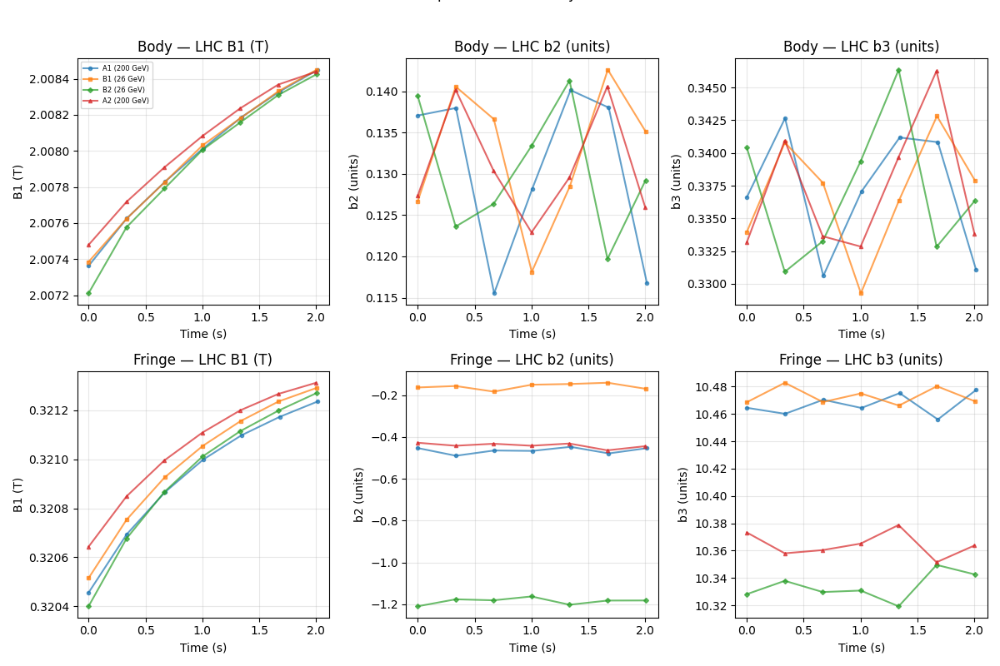

In [14]:
print("=== LHC Top (~5781 A) ===")
for seg in SEGMENTS:
    print(f"\n--- {SEG_LABEL[seg]} ---")
    for name in SESSION_NAMES:
        g = get_group(all_groups[name], cycle="LHC", label="lhc_top")
        if g is None: continue
        sub = get_settled_slice(turns[seg][name], g, N_SETTLE["lhc_top"])
        print(f"  {name}: B1={sub.B1_T.mean():.6f} +/- {sub.B1_T.std():.6f} T, "
              f"b2={sub.b2.mean():.3f}, b3={sub.b3.mean():.3f}")

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for row, seg in enumerate(SEGMENTS):
    for ci, (col, ylabel) in enumerate([("B1_T","B1 (T)"),("b2","b2 (units)"),("b3","b3 (units)")]):
        ax = axes[row, ci]
        for name in SESSION_NAMES:
            g = get_group(all_groups[name], cycle="LHC", label="lhc_top")
            if g is None: continue
            sub = turns[seg][name].iloc[g["start"]:g["end"]]
            lt = sub.t_s.values - sub.t_s.values[0]
            ax.plot(lt, sub[col], f"{MARKERS[name]}-", ms=3, color=COLORS[name], alpha=0.7,
                    label=name if row==0 else None)
        ax.set_xlabel("Time (s)"); ax.set_ylabel(ylabel)
        ax.set_title(f"{SEG_LABEL[seg]} \u2014 LHC {ylabel}")
        if row==0 and ci==0: ax.legend(fontsize=6)
fig.suptitle("LHC Top Plateau \u2014 Turn-by-Turn", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()


---
## 12. Post-SFTPRO and Post-LHC Idle — Body vs Fringe


=== Post-SFTPRO idle (~155 A) ===
  --- Body ---
    A1 (200 GeV): B1=0.060499 +/- 0.000005 T, b2=0.274, b3=-0.489
    B1 (26 GeV): B1=0.060503 +/- 0.000005 T, b2=0.263, b3=-0.495
    B2 (26 GeV): B1=0.060503 +/- 0.000004 T, b2=0.266, b3=-0.491
    A2 (200 GeV): B1=0.060502 +/- 0.000005 T, b2=0.261, b3=-0.489
  --- Fringe ---
    A1 (200 GeV): B1=0.010108 +/- 0.000006 T, b2=1.396, b3=6.074
    B1 (26 GeV): B1=0.010110 +/- 0.000006 T, b2=1.703, b3=6.045
    B2 (26 GeV): B1=0.010109 +/- 0.000006 T, b2=0.852, b3=5.894
    A2 (200 GeV): B1=0.010112 +/- 0.000006 T, b2=1.880, b3=5.995

=== Post-LHC idle (~155 A, control) ===
  --- Body ---
    A1 (200 GeV): B1=0.060494 +/- 0.000005 T, b2=0.255, b3=-0.478
    B1 (26 GeV): B1=0.060497 +/- 0.000005 T, b2=0.252, b3=-0.473
    B2 (26 GeV): B1=0.060493 +/- 0.000025 T, b2=0.249, b3=-0.473
    A2 (200 GeV): B1=0.060496 +/- 0.000004 T, b2=0.250, b3=-0.473
  --- Fringe ---
    A1 (200 GeV): B1=0.010092 +/- 0.000006 T, b2=1.483, b3=6.201
    B1 (26 Ge

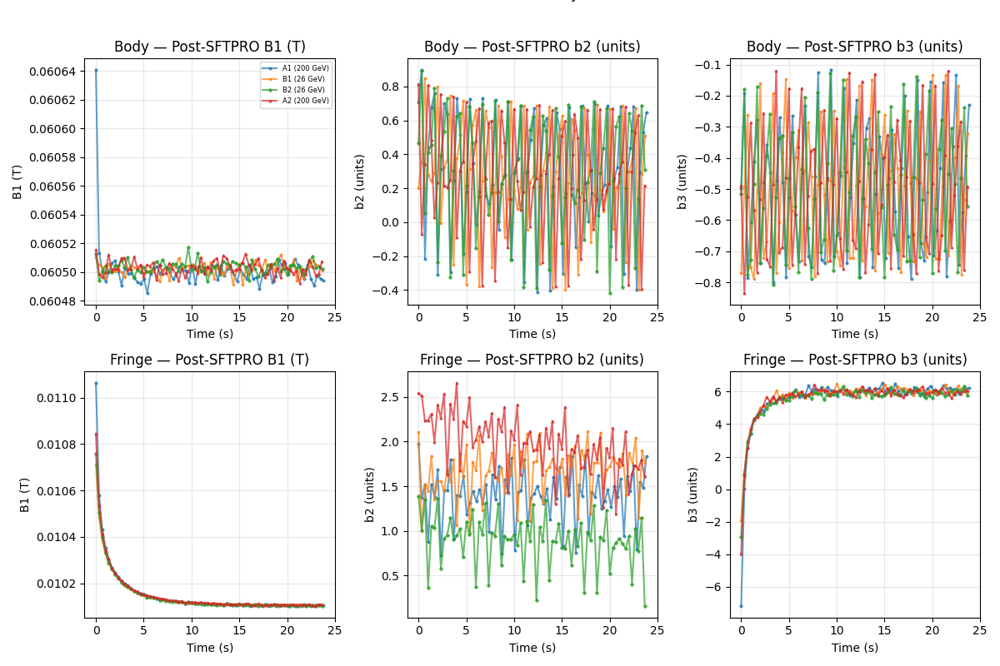

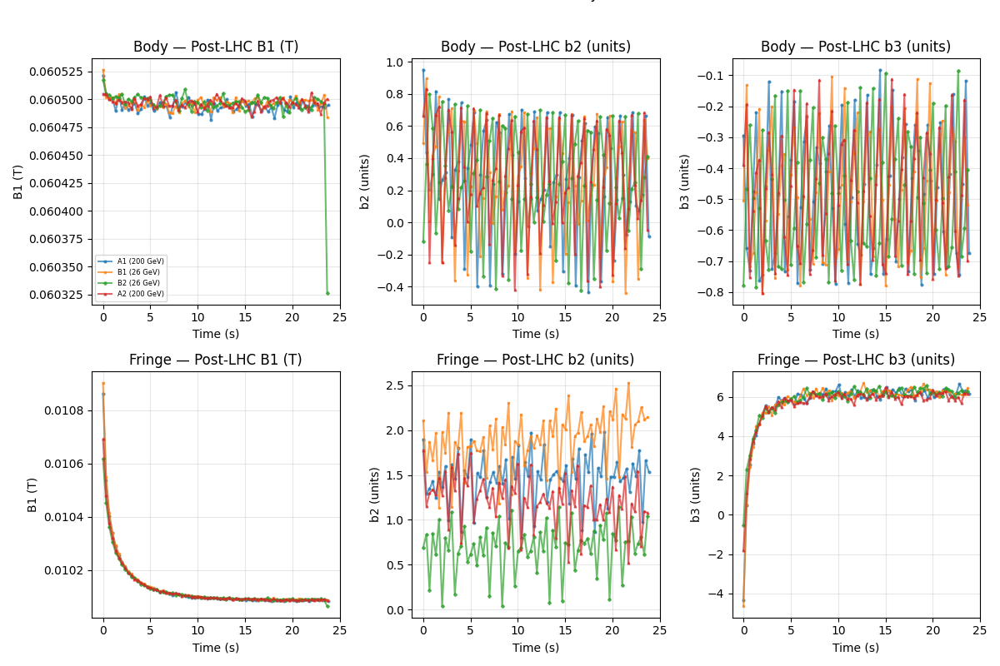

In [15]:
for cycle_label, cycle_name, desc in [
    ("SFTPRO->LHC", "idle", "Post-SFTPRO idle (~155 A)"),
    ("post-LHC", "idle", "Post-LHC idle (~155 A, control)"),
]:
    print(f"\n=== {desc} ===")
    for seg in SEGMENTS:
        print(f"  --- {SEG_LABEL[seg]} ---")
        for name in SESSION_NAMES:
            g = get_group(all_groups[name], cycle=cycle_label, label=cycle_name)
            if g is None: continue
            sub = get_settled_slice(turns[seg][name], g, N_SETTLE["idle"])
            print(f"    {name}: B1={sub.B1_T.mean():.6f} +/- {sub.B1_T.std():.6f} T, "
                  f"b2={sub.b2.mean():.3f}, b3={sub.b3.mean():.3f}")

# Post-SFTPRO idle
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for row, seg in enumerate(SEGMENTS):
    for ci, (col, ylabel) in enumerate([("B1_T","B1 (T)"),("b2","b2 (units)"),("b3","b3 (units)")]):
        ax = axes[row, ci]
        for name in SESSION_NAMES:
            g = get_group(all_groups[name], cycle="SFTPRO->LHC", label="idle")
            if g is None: continue
            sub = turns[seg][name].iloc[g["start"]:g["end"]]
            lt = sub.t_s.values - sub.t_s.values[0]
            ax.plot(lt, sub[col], f"{MARKERS[name]}-", ms=2, color=COLORS[name], alpha=0.7,
                    label=name if row==0 else None)
        ax.set_xlabel("Time (s)"); ax.set_ylabel(ylabel)
        ax.set_title(f"{SEG_LABEL[seg]} \u2014 Post-SFTPRO {ylabel}")
        if row==0 and ci==0: ax.legend(fontsize=6)
fig.suptitle("Post-SFTPRO Idle \u2014 Turn-by-Turn", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()

# Post-LHC idle (control)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for row, seg in enumerate(SEGMENTS):
    for ci, (col, ylabel) in enumerate([("B1_T","B1 (T)"),("b2","b2 (units)"),("b3","b3 (units)")]):
        ax = axes[row, ci]
        for name in SESSION_NAMES:
            g = get_group(all_groups[name], cycle="post-LHC", label="idle")
            if g is None: continue
            sub = turns[seg][name].iloc[g["start"]:g["end"]]
            lt = sub.t_s.values - sub.t_s.values[0]
            ax.plot(lt, sub[col], f"{MARKERS[name]}-", ms=2, color=COLORS[name], alpha=0.7,
                    label=name if row==0 else None)
        ax.set_xlabel("Time (s)"); ax.set_ylabel(ylabel)
        ax.set_title(f"{SEG_LABEL[seg]} \u2014 Post-LHC {ylabel}")
        if row==0 and ci==0: ax.legend(fontsize=6)
fig.suptitle("Post-LHC Idle (Control) \u2014 Turn-by-Turn", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()


---
## 13. A-B-B-A Reproducibility & True Hysteresis — Body vs Fringe

In [16]:
def find_last_md1_idle(groups, df, min_turns=40, max_I_range=2.0):
    """Find the last MD1 idle group with sufficient turns and stable current."""
    n_settle = N_SETTLE.get("idle", 50)
    idles = [g for g in groups
             if g.get("phase") == "md1" and g["label"] == "idle"
             and g["n_turns"] >= min_turns]
    for g in reversed(idles):
        n = min(n_settle, g["n_turns"])
        sub = df.iloc[g["end"] - n : g["end"]]
        if sub["I_A"].max() - sub["I_A"].min() < max_I_range:
            return g
    return None


def clean_outliers(sub, k_mad=3.5, trim_edges=2):
    """Reject outlier turns using MAD-based clipping + edge trimming.

    Parameters
    ----------
    k_mad : float
        Multiplier on MAD for B1 and I clipping. 3.5 ≈ 2.4σ for Gaussian.
    trim_edges : int
        Drop this many turns from start and end of the slice (catches ramp edges).
    """
    if len(sub) < 2 * trim_edges + 5:
        return sub
    # Edge trimming: drop first/last turns that may catch ramp
    sub = sub.iloc[trim_edges : len(sub) - trim_edges]
    # B1 clipping
    med_B1 = sub["B1_T"].median()
    mad_B1 = (sub["B1_T"] - med_B1).abs().median()
    if mad_B1 > 0:
        mask_B1 = (sub["B1_T"] - med_B1).abs() <= k_mad * mad_B1
    else:
        mask_B1 = True  # all identical → keep all
    # I clipping (catches remaining ramp-edge turns)
    med_I = sub["I_A"].median()
    mad_I = (sub["I_A"] - med_I).abs().median()
    if mad_I > 0:
        mask_I = (sub["I_A"] - med_I).abs() <= k_mad * mad_I
    else:
        mask_I = (sub["I_A"] - med_I).abs() <= 0.5
    mask = mask_B1 & mask_I
    n_rejected = (~mask).sum()
    if n_rejected > 0:
        print(f"    outlier rejection: {n_rejected}/{len(sub)} turns removed "
              f"(B1 MAD={mad_B1*1e6:.1f} µT, I MAD={mad_I:.3f} A)")
    return sub[mask]


MAX_I_RANGE_SETTLED = {
    "idle": 1.0,
    "injection": 1.0,
    "sftpro_top": 3.0,
    "lhc_top": 3.0,
}

PLATEAUS = [
    ("Last MD1 idle", None, None),
    ("SFTPRO top","SFTPRO","sftpro_top"), ("Post-SFTPRO idle","SFTPRO->LHC","idle"),
    ("LHC top","LHC","lhc_top"), ("Post-LHC idle","post-LHC","idle"),
]
A_sessions = ["A1 (200 GeV)", "A2 (200 GeV)"]
B_sessions = ["B1 (26 GeV)",  "B2 (26 GeV)"]

plat_vals, plat_stds, plat_ns = {}, {}, {}
for seg in SEGMENTS:
    plat_vals[seg], plat_stds[seg], plat_ns[seg] = {}, {}, {}
    for pn, cyc, lab in PLATEAUS:
        plat_vals[seg][pn], plat_stds[seg][pn], plat_ns[seg][pn] = {}, {}, {}
        for name in SESSION_NAMES:
            if cyc is None:
                g = find_last_md1_idle(all_groups[name], turns["body"][name])
            else:
                g = get_group(all_groups[name], cycle=cyc, label=lab)
            if g is None: continue
            n_s = N_SETTLE.get(g["label"], 18)
            sub = get_settled_slice(turns[seg][name], g, n_s)

            I_range = sub["I_A"].max() - sub["I_A"].min()
            max_ir = MAX_I_RANGE_SETTLED.get(g["label"], 2.0)
            if I_range > max_ir:
                print(f"  WARNING: {seg}/{name}/{pn}: I_range={I_range:.2f} A > {max_ir} A — SKIPPED")
                continue

            sub = clean_outliers(sub)

            plat_vals[seg][pn][name] = {c: sub[c].mean() for c in ["B1_T","b2","b3"]}
            plat_stds[seg][pn][name] = {c: sub[c].std() for c in ["B1_T","b2","b3"]}
            plat_ns[seg][pn][name] = len(sub)

print("A-B-B-A REPRODUCIBILITY CHECK")
print("=" * 100)
for s1, s2, desc in [("A1 (200 GeV)","A2 (200 GeV)","200 GeV"),("B1 (26 GeV)","B2 (26 GeV)","26 GeV")]:
    print(f"\n--- {desc} reproducibility: {s1} vs {s2} ---")
    for seg in SEGMENTS:
        print(f"  {SEG_LABEL[seg]}:")
        for pn, _, _ in PLATEAUS:
            v1, v2 = plat_vals[seg][pn].get(s1), plat_vals[seg][pn].get(s2)
            if v1 is None or v2 is None: continue
            d_B1 = (v2["B1_T"]-v1["B1_T"])*1e6
            n1, n2 = plat_ns[seg][pn][s1], plat_ns[seg][pn][s2]
            sem = np.sqrt(plat_stds[seg][pn][s1]["B1_T"]**2/n1 + plat_stds[seg][pn][s2]["B1_T"]**2/n2)*1e6
            sig = abs(d_B1)/sem if sem > 0 else 0
            print(f"    {pn:22s}  dB1={d_B1:+8.1f} uT ({sig:.1f}σ)  "
                  f"db2={v2['b2']-v1['b2']:+.3f}  db3={v2['b3']-v1['b3']:+.3f}")


    outlier rejection: 3/46 turns removed (B1 MAD=2.9 µT, I MAD=0.056 A)
    outlier rejection: 6/46 turns removed (B1 MAD=2.4 µT, I MAD=0.054 A)
    outlier rejection: 2/46 turns removed (B1 MAD=2.9 µT, I MAD=0.074 A)
    outlier rejection: 2/46 turns removed (B1 MAD=3.8 µT, I MAD=0.056 A)
    outlier rejection: 2/46 turns removed (B1 MAD=4.1 µT, I MAD=0.056 A)
    outlier rejection: 6/46 turns removed (B1 MAD=2.3 µT, I MAD=0.075 A)
    outlier rejection: 4/46 turns removed (B1 MAD=2.2 µT, I MAD=0.074 A)
    outlier rejection: 3/46 turns removed (B1 MAD=3.0 µT, I MAD=0.051 A)
    outlier rejection: 4/46 turns removed (B1 MAD=2.5 µT, I MAD=0.078 A)
    outlier rejection: 8/46 turns removed (B1 MAD=1.9 µT, I MAD=0.055 A)
    outlier rejection: 1/46 turns removed (B1 MAD=3.5 µT, I MAD=0.069 A)
    outlier rejection: 4/46 turns removed (B1 MAD=2.8 µT, I MAD=0.050 A)
    outlier rejection: 1/46 turns removed (B1 MAD=1.3 µT, I MAD=0.056 A)
    outlier rejection: 5/46 turns removed (B1 MAD=1

In [17]:
print("TRUE HYSTERESIS: Average(200 GeV) vs Average(26 GeV)")
print("=" * 100)

summary_rows = {}
for seg in SEGMENTS:
    summary_rows[seg] = []
    print(f"\n--- {SEG_LABEL[seg]} ---")
    print(f"{'Plateau':<22s} {'200GeV B1(T)':>14s} {'26GeV B1(T)':>14s} "
          f"{'Delta B1(uT)':>13s} {'Delta b2':>10s} {'Delta b3':>10s}")
    print("-" * 87)
    for pn, cyc, lab in PLATEAUS:
        vA = [plat_vals[seg][pn][s] for s in A_sessions if s in plat_vals[seg][pn]]
        vB = [plat_vals[seg][pn][s] for s in B_sessions if s in plat_vals[seg][pn]]
        if not vA or not vB: continue
        row = {"Plateau": pn}
        for col in ["B1_T","b2","b3"]:
            row[f"A_{col}"] = np.mean([v[col] for v in vA])
            row[f"B_{col}"] = np.mean([v[col] for v in vB])
            row[f"d_{col}"] = row[f"B_{col}"] - row[f"A_{col}"]
        summary_rows[seg].append(row)
        print(f"{pn:<22s} {row['A_B1_T']:>14.6f} {row['B_B1_T']:>14.6f} "
              f"{row['d_B1_T']*1e6:>+13.1f} {row['d_b2']:>+10.3f} {row['d_b3']:>+10.3f}")

print("\n\nStatistical significance (pooled):")
for seg in SEGMENTS:
    print(f"  --- {SEG_LABEL[seg]} ---")
    for pn, cyc, lab in PLATEAUS:
        aA, aB = [], []
        for s in A_sessions:
            if cyc is None:
                g = find_last_md1_idle(all_groups[s], turns["body"][s])
            else:
                g = get_group(all_groups[s], cycle=cyc, label=lab)
            if g:
                n_s = N_SETTLE.get(g["label"], 18)
                sub = get_settled_slice(turns[seg][s], g, n_s)
                I_range = sub["I_A"].max() - sub["I_A"].min()
                if I_range <= MAX_I_RANGE_SETTLED.get(g["label"], 2.0):
                    sub = clean_outliers(sub)
                    aA.extend(sub.B1_T.values)
        for s in B_sessions:
            if cyc is None:
                g = find_last_md1_idle(all_groups[s], turns["body"][s])
            else:
                g = get_group(all_groups[s], cycle=cyc, label=lab)
            if g:
                n_s = N_SETTLE.get(g["label"], 18)
                sub = get_settled_slice(turns[seg][s], g, n_s)
                I_range = sub["I_A"].max() - sub["I_A"].min()
                if I_range <= MAX_I_RANGE_SETTLED.get(g["label"], 2.0):
                    sub = clean_outliers(sub)
                    aB.extend(sub.B1_T.values)
        aA, aB = np.array(aA), np.array(aB)
        if len(aA)==0 or len(aB)==0: continue
        d = (aB.mean()-aA.mean())*1e6
        sem = np.sqrt(aA.var()/len(aA)+aB.var()/len(aB))*1e6
        sig = abs(d)/sem if sem > 0 else 0
        print(f"    {pn:22s}: delta={d:+.1f} uT, SEM={sem:.1f} uT, {sig:.1f}σ")


TRUE HYSTERESIS: Average(200 GeV) vs Average(26 GeV)

--- Body ---
Plateau                  200GeV B1(T)    26GeV B1(T)  Delta B1(uT)   Delta b2   Delta b3
---------------------------------------------------------------------------------------
Last MD1 idle                0.060558       0.060558          -0.8     -0.436     +0.252
Post-SFTPRO idle             0.060501       0.060503          +2.7     +0.012     +0.005
LHC top                      2.008184       2.008151         -33.1     +0.002     +0.001
Post-LHC idle                0.060495       0.060497          +2.1     +0.046     +0.032

--- Fringe ---
Plateau                  200GeV B1(T)    26GeV B1(T)  Delta B1(uT)   Delta b2   Delta b3
---------------------------------------------------------------------------------------
Last MD1 idle                0.010241       0.010188         -52.1     -0.544     +0.175
Post-SFTPRO idle             0.010108       0.010107          -1.1     -0.355     -0.044
LHC top                      

---
## 14. Summary: Delta Bar Charts — Body vs Fringe

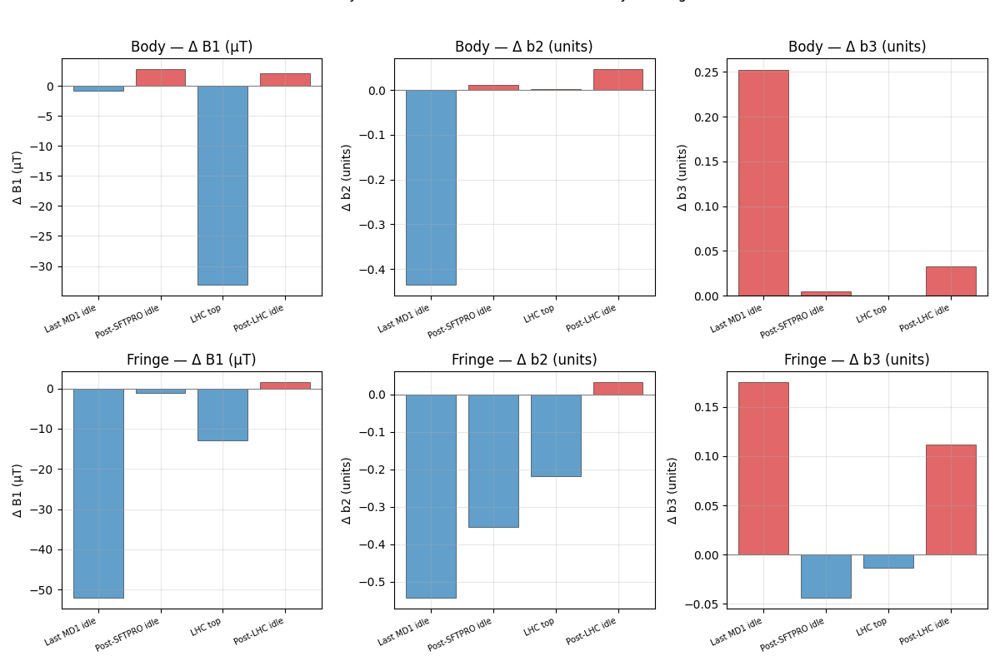

In [18]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for row, seg in enumerate(SEGMENTS):
    plabs = [r["Plateau"] for r in summary_rows[seg]]
    x = np.arange(len(plabs))
    for ci, (key, ylabel) in enumerate([("d_B1_T","\u0394 B1 (\u00b5T)"),("d_b2","\u0394 b2 (units)"),("d_b3","\u0394 b3 (units)")]):
        ax = axes[row, ci]
        vals = [r[key]*(1e6 if "B1" in key else 1) for r in summary_rows[seg]]
        colors = ["tab:red" if v > 0 else "tab:blue" for v in vals]
        ax.bar(x, vals, color=colors, alpha=0.7, edgecolor="black", lw=0.5)
        ax.set_xticks(x); ax.set_xticklabels(plabs, rotation=25, ha="right", fontsize=7)
        ax.set_ylabel(ylabel); ax.axhline(0, color="grey", lw=0.8)
        ax.set_title(f"{SEG_LABEL[seg]} \u2014 {ylabel}")
fig.suptitle("True Hysteresis: \u0394(26 GeV \u2212 200 GeV) \u2014 Body vs Fringe", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()


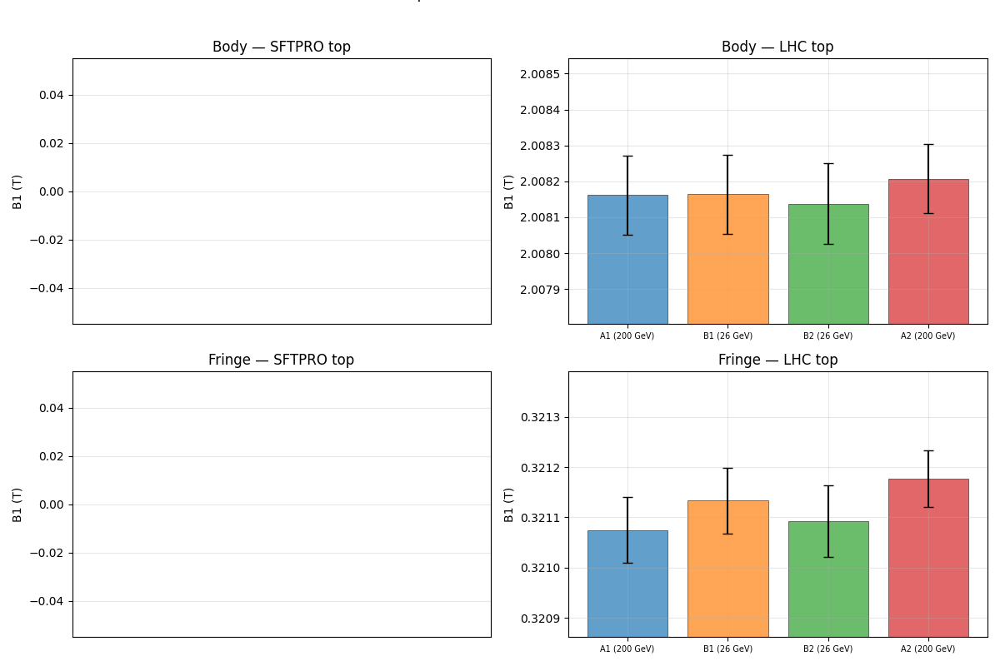

In [19]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
for row, seg in enumerate(SEGMENTS):
    for ci, (pn, cyc, lab) in enumerate([("SFTPRO top","SFTPRO","sftpro_top"),("LHC top","LHC","lhc_top")]):
        ax = axes[row, ci]
        slabs, bv, be, bc = [], [], [], []
        for name in SESSION_NAMES:
            v = plat_vals[seg][pn].get(name); s = plat_stds[seg][pn].get(name)
            n = plat_ns[seg][pn].get(name, 0)
            if v is None: continue
            slabs.append(name); bv.append(v["B1_T"])
            be.append(s["B1_T"]/np.sqrt(n) if n>1 else 0); bc.append(COLORS[name])
        x = np.arange(len(slabs))
        ax.bar(x, bv, yerr=be, color=bc, alpha=0.7, edgecolor="black", lw=0.5, capsize=4)
        ax.set_xticks(x); ax.set_xticklabels(slabs, fontsize=7)
        ax.set_ylabel("B1 (T)"); ax.set_title(f"{SEG_LABEL[seg]} \u2014 {pn}")
        if bv:
            margin = 3*max(be) if max(be) > 0 else abs(max(bv)-min(bv))*0.5+1e-6
            ax.set_ylim(min(bv)-margin, max(bv)+margin)
fig.suptitle("B1 at Flat Tops \u2014 Per Session (error bars = SEM)", fontsize=12, y=1.02)
plt.tight_layout(); plt.show()


---
## 15. Full Summary Table

In [20]:
table_rows = []
for seg in SEGMENTS:
    for pn, cyc, lab in PLATEAUS:
        for name in SESSION_NAMES:
            v = plat_vals[seg][pn].get(name); s = plat_stds[seg][pn].get(name)
            n = plat_ns[seg][pn].get(name, 0)
            if v is None: continue
            table_rows.append({"Segment": SEG_LABEL[seg], "Plateau": pn, "Session": name,
                "MD1": SESSIONS[name]["md1"], "N": n,
                "B1 (T)": v["B1_T"], "B1 std (T)": s["B1_T"],
                "b2 (units)": v["b2"], "b3 (units)": v["b3"]})
df_table = pd.DataFrame(table_rows)
print("Full Summary Table")
print("=" * 115)
display(df_table.round(6))


Full Summary Table


,Segment,Plateau,Session,MD1,N,B1 (T),B1 std (T),b2 (units),b3 (units)
0,Body,Last MD1 idle,A1 (200 GeV),200 GeV,43,0.060555,0.000004,0.690584,-0.770589
1,Body,Last MD1 idle,B1 (26 GeV),26 GeV,40,0.060558,0.000004,0.258960,-0.516075
2,Body,Last MD1 idle,B2 (26 GeV),26 GeV,44,0.060558,0.000004,0.234980,-0.518510
3,Body,Last MD1 idle,A2 (200 GeV),200 GeV,44,0.060561,0.000005,0.674732,-0.768274
4,Body,Post-SFTPRO idle,A1 (200 GeV),200 GeV,44,0.060499,0.000005,0.260007,-0.490678
5,Body,Post-SFTPRO idle,B1 (26 GeV),26 GeV,40,0.060504,0.000003,0.273624,-0.488343
6,Body,Post-SFTPRO idle,B2 (26 GeV),26 GeV,42,0.060503,0.000003,0.259526,-0.489252
7,Body,Post-SFTPRO idle,A2 (200 GeV),200 GeV,43,0.060502,0.000005,0.248375,-0.496435
8,Body,LHC top,A1 (200 GeV),200 GeV,5,2.008161,0.000247,0.127743,0.336148
9,Body,LHC top,B1 (26 GeV),26 GeV,5,2.008164,0.000246,0.132199,0.336811


---
## 16. Interpretation

### Body vs Fringe Key Differences

- **TF ratio:** Body ≈ 0.35 T/kA, fringe ≈ 0.06 T/kA (factor ~6)
- **Harmonic amplification:** b_n = C_n/B1 × 10⁴. Fringe has ~6× smaller B1,
  so the same absolute C_n produces ~6× larger b_n. Fringe harmonics are noisier and larger.
- **B1 noise:** Similar absolute per-turn std, but 6× worse relative noise in fringe.

### Hysteresis Consistency

Both segments measure the same iron. If Preisach prediction (Δ = 0 after standardization)
holds, it holds for both. Any discrepancy beyond noise would indicate segment-dependent effects.

### Post-LHC Control

Both segments descend from 5781 A. Post-LHC idle should be identical across all sessions
for both segments — the strongest consistency check.

---
## Notes

- **Encoder offset correction** applied to both segments: `encoder_offset_rad = −π/2`.
- **Plateau classification** uses body current (identical for both segments).
- **Settling:** idle=50, sftpro=15, lhc=5 turns.
- **No NMR** in this campaign.
- **Per-turn averaging artifact** on 200 GeV MD1: per-turn I(A) varies 2150–2300 A,
  instantaneous DCCT peaks consistent at ~2345 A (see body/fringe notebooks for raw DCCT).